# Diffraction Image Analysis Toolkit

A small toolkit for working with X-ray diffraction (XRD) detector images.

**What this notebook does, end to end:**
1. Load a TIFF detector image and scale it for display (pyFAI-style).
2. Find the **beam center** (where the diffraction rings are centered).
3. Predict **single-crystal diffraction spots** from a crystal structure (`.cif`) file.
4. **Overlay** predicted rings onto the real image to identify which spots come from the substrate vs. the film.

**Notebook layout**
- Section 0 — Setup & imports
- Section 1 — Mount Google Drive
- Section 2 — Data file paths
- Section 3 — Function library (loader, two center-finders, ring overlay)
- Section 4 — Find the beam center (powder sample)
- Section 5 — Loading example & output shapes
- Section 6 — Predicted single-crystal spots from a CIF
- Section 7 — Overlay predicted rings on the image
- Section 8 — Extra / unused utilities


## 0. Setup & Imports

Install the third-party packages and import everything used throughout the
notebook in one place, so later cells stay focused on the analysis.


In [ ]:
# Third-party packages (TIFF reading + crystallography)
!pip install tifffile gemmi


In [ ]:
# Standard library
import os
import re
import math
from itertools import product
from collections import defaultdict

# Scientific stack
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import tifffile
import gemmi

from scipy.ndimage import gaussian_filter, sobel
from scipy.optimize import minimize


## 1. Mount Google Drive

The image and CIF files live in a shared Drive folder. Create a **shortcut**
to that shared folder in your own Drive so the paths below resolve. If you
access the files another way, just edit the paths in Section 2.


datalink: https://drive.google.com/drive/u/1/folders/1RTY1fPUkWfnLAIFtACJDpRkoZwzjyx8X

In [ ]:
from google.colab import drive

drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## 2. Data File Paths

All input files referenced by the notebook. Edit these if your folder layout
differs.


In [ ]:
# Folders containing the test TIFFs
data_dir = [
    '/content/drive/MyDrive/Background Removal Data Nb blank Ti/Test Tiffs/Stitched Images',
    '/content/drive/MyDrive/Background Removal Data Nb blank Ti/Test Tiffs/Wafer Images',
]

# Test images:
#   [0] powder/diffraction sum image (good clear rings -> easy center finding)
#   [1] blank (background only)
#   [2] Nb side of the wafer
#   [3] Ti side of the wafer
image_test = [
    'xrd_JS06_20260323-162040_b9dead_sum.tiff',
    'Blank.tiff',
    'Nb.tiff',
    'Ti.tiff',
]

# Crystal structure used for the single-crystal spot prediction (Section 6)
cif_file = '/content/drive/MyDrive/Background Removal Data Nb blank Ti/film.cif'


## 3. Function Library

Four reusable functions, one per cell:

| Function | Purpose |
|---|---|
| `load_and_view_tiff_pyfai` | Load a TIFF, scale it for display, and export pixel datasets. |
| `find_diffraction_center_frst` | beam-center finder via radial-symmetry voting (slower). |
| `find_diffraction_center` |  beam-center finder via radial-histogram sharpness. |
| `overlay_diffraction_rings` | Draw rings of given radii around a center on an image. |


### 3.1 Load & scale a TIFF (`load_and_view_tiff_pyfai`)

In [ ]:
def load_and_view_tiff_pyfai(
    data_dir,
    filename,
    cmap='inferno',
    percentile_low=1,
    percentile_high=99.5,
    log_scale=True,
    figsize=(8, 8),
    show_plot=True,
):
    """
    Load, scale, display, and export TIFF image data (pyFAI-style).

    Returns
    -------
    image_array    : np.ndarray  - original image data
    raw_dataset    : np.ndarray  - (N, 3) array of [x, y, raw_intensity]
    scaled_dataset : np.ndarray  - (N, 3) array of [x, y, scaled_intensity]
    display_image  : np.ndarray  - 2D scaled image used for visualization
    """
    # --- Load image ---
    file_path = os.path.join(data_dir, filename)
    if not os.path.exists(file_path):
        raise FileNotFoundError(f"File not found: {file_path}")

    image_array = tifffile.imread(file_path)
    image = image_array.astype(np.float64)  # float for processing

    # --- Keep only finite pixels for the percentile stretch ---
    finite_mask = np.isfinite(image)
    if not np.any(finite_mask):
        raise ValueError("Image contains no finite values.")
    valid_pixels = image[finite_mask]

    # --- pyFAI-like scaling: clip to percentile range, shift, optional log ---
    vmin = np.percentile(valid_pixels, percentile_low)
    vmax = np.percentile(valid_pixels, percentile_high)
    if vmax <= vmin:
        vmax = vmin + 1e-9

    clipped = np.clip(image, vmin, vmax) - vmin   # clip + shift baseline to 0
    if log_scale:
        clipped = np.log1p(clipped)               # compress dynamic range

    # --- Normalize to 0-1 and clean invalid values ---
    finite_clipped = clipped[np.isfinite(clipped)]
    cmin, cmax = finite_clipped.min(), finite_clipped.max()
    display_image = (clipped - cmin) / (cmax - cmin)
    display_image = np.nan_to_num(display_image, nan=0, posinf=1, neginf=0)

    # --- Build per-pixel coordinate grids ---
    height, width = image.shape[:2]
    y_positions, x_positions = np.indices((height, width))

    # --- Flatten into [x, y, intensity] datasets ---
    raw_dataset = np.column_stack(
        (x_positions.ravel(), y_positions.ravel(), image.ravel())
    )
    scaled_dataset = np.column_stack(
        (x_positions.ravel(), y_positions.ravel(), display_image.ravel())
    )

    # --- Display ---
    if show_plot:
        plt.figure(figsize=figsize)
        plt.imshow(display_image, cmap=cmap, origin='lower')
        plt.colorbar(label='Scaled Intensity')
        plt.title(f"{filename}\nDisplay Range: [{vmin:.3g}, {vmax:.3g}]")
        plt.tight_layout()
        plt.show()

    return image_array, raw_dataset, scaled_dataset, display_image


### 3.2 center finder (`find_diffraction_center_frst`)

Radial-symmetry / gradient-voting method. Slower but reliable on incomplete
rings, partial arcs, strong intensity asymmetry, and spotty diffraction.


In [ ]:
def find_diffraction_center_frst(
    display_image,
    blur_sigma=2,
    edge_percentile=94,
    line_length=200,
    show_plot=True,
    figsize=(10, 10),
):
    """
    Find the diffraction center by having edge pixels "vote" along their
    gradient direction; rays from a ring all converge on the center.

    Returns
    -------
    center_x, center_y : float
    accumulator        : np.ndarray  (vote map)
    """
    image = np.nan_to_num(np.asarray(display_image, dtype=np.float64), nan=0)

    # --- Smooth, then compute gradient magnitude (Sobel) ---
    smoothed = gaussian_filter(image, sigma=blur_sigma)
    gx = sobel(smoothed, axis=1)
    gy = sobel(smoothed, axis=0)
    grad_mag = np.sqrt(gx**2 + gy**2)

    # --- Keep only the strongest edge pixels ---
    threshold = np.percentile(grad_mag[grad_mag > 0], edge_percentile)
    mask = grad_mag >= threshold
    y_points, x_points = np.nonzero(mask)

    # --- Cast votes along each edge pixel's gradient (both directions) ---
    accumulator = np.zeros_like(image, dtype=np.float64)
    height, width = image.shape

    for y, x in zip(y_points, x_points):
        gxn, gyn = gx[y, x], gy[y, x]
        norm = np.sqrt(gxn**2 + gyn**2)
        if norm == 0:
            continue
        gxn, gyn = gxn / norm, gyn / norm

        for sign in (+1, -1):              # gradient may point in/out
            dx, dy = sign * gxn, sign * gyn
            for r in range(line_length):
                xx = int(round(x + dx * r))
                yy = int(round(y + dy * r))
                if xx < 0 or xx >= width or yy < 0 or yy >= height:
                    break
                accumulator[yy, xx] += 1

    # --- Center = brightest point in the vote map ---
    center_y, center_x = np.unravel_index(np.argmax(accumulator), accumulator.shape)

    if show_plot:
        fig, ax = plt.subplots(1, 2, figsize=(14, 7))
        ax[0].imshow(display_image, cmap='inferno', origin='lower')
        ax[0].scatter(center_x, center_y, s=300, marker='x')
        ax[0].set_title(f"Detected Center\nx={center_x}, y={center_y}")
        ax[1].imshow(accumulator, cmap='viridis', origin='lower')
        ax[1].scatter(center_x, center_y, s=300, marker='x')
        ax[1].set_title("Radial Symmetry Accumulator")
        plt.tight_layout()
        plt.show()

    return center_x, center_y, accumulator


### 3.3 Fast center finder (`find_diffraction_center`)

Optimizes the center so the radial intensity histogram is as **sharp** as
possible. Quick first pass when rings are reasonably complete.


In [ ]:
def find_diffraction_center(
    display_image,
    blur_sigma=2,
    intensity_percentile=92,
    radial_bins=500,
    show_plot=True,
    figsize=(10, 10),
):
    """
    Find the ring center by maximizing radial-histogram sharpness.

    Returns
    -------
    center_x, center_y : float
    """
    image = np.nan_to_num(np.asarray(display_image, dtype=np.float64), nan=0)

    # --- Smooth and keep the brightest (ring) pixels ---
    smoothed = gaussian_filter(image, sigma=blur_sigma)
    threshold = np.percentile(smoothed[smoothed > 0], intensity_percentile)
    mask = smoothed >= threshold
    y_points, x_points = np.nonzero(mask)
    weights = smoothed[mask]

    # --- Intensity-weighted centroid as the starting guess ---
    x0 = np.average(x_points, weights=weights)
    y0 = np.average(y_points, weights=weights)

    def radial_sharpness_metric(center):
        # Correct center -> ring pixels fall into few radial bins (sharp peaks).
        xc, yc = center
        r = np.sqrt((x_points - xc)**2 + (y_points - yc)**2)
        hist, _ = np.histogram(r, bins=radial_bins, weights=weights)
        return -np.sum(hist**2)            # maximize sharpness => minimize -sharpness

    result = minimize(radial_sharpness_metric, x0=[x0, y0], method='Nelder-Mead')
    center_x, center_y = result.x

    if show_plot:
        plt.figure(figsize=figsize)
        plt.imshow(display_image, cmap='inferno', origin='lower')
        plt.scatter(center_x, center_y, s=250, marker='x')
        plt.title(f"Optimized Diffraction Center\nx = {center_x:.2f}, y = {center_y:.2f}")
        plt.colorbar(label='Scaled Intensity')
        plt.tight_layout()
        plt.show()

    return center_x, center_y


### 3.4 Overlay rings (`overlay_diffraction_rings`)

In [ ]:
def overlay_diffraction_rings(
    image,
    center,
    radii,
    cmap='inferno',
    figsize=(8, 8),
    ring_color='cyan',
    ring_width=1.5,
    show_center=True,
    save_path=None,
):
    """
    Draw circles of the given pixel radii around `center` on top of `image`.

    Parameters
    ----------
    center : (x_center, y_center)
    radii  : iterable of ring radii in pixels

    Returns
    -------
    fig, ax
    """
    xc, yc = center
    fig, ax = plt.subplots(figsize=figsize)
    ax.imshow(image, cmap=cmap, origin='lower')

    # --- Draw each ring as a parametric circle ---
    theta = np.linspace(0, 2 * np.pi, 1000)
    for r in radii:
        ax.plot(xc + r * np.cos(theta), yc + r * np.sin(theta),
                color=ring_color, linewidth=ring_width)

    if show_center:
        ax.scatter(xc, yc, color='red', s=120, marker='x')

    ax.set_title("Diffraction Rings Overlay")
    ax.set_axis_off()
    plt.tight_layout()

    if save_path is not None:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.show()

    return fig, ax


## 4. Find the Beam Center (Powder Sample)

The powder image has clean, well-defined rings, which makes it ideal for
locating the beam center. Load it, then run the robust center finder.


In [ ]:
# Load the powder/diffraction sum image
image_array, raw_data, scaled_data, display_image = load_and_view_tiff_pyfai(
    data_dir[0],
    image_test[0],
    percentile_low=1,
    percentile_high=99.9,
)

# Locate the beam center (robust method) (appx. 4 min)
center_x, center_y, accumulator = find_diffraction_center_frst(display_image)


## 5. Loading Example & Output Shapes

Minimum input to the loader is just the directory and filename. It returns:

- `image_array`    - original image data
- `raw_dataset`    - (N, 3): `[x, y, raw_intensity]`
- `scaled_dataset` - (N, 3): `[x, y, scaled_intensity]`
- `display_image`  - 2D scaled image for visualization


In [ ]:
# Load the blank (background-only) image as a demonstration
image_array, raw_data, scaled_data, display_image = load_and_view_tiff_pyfai(
    data_dir[1],
    image_test[2],
    percentile_low=1,
    percentile_high=99.9,
)


In [ ]:
image_array, raw_data, scaled_data, display_image_cr = load_and_view_tiff_pyfai(
    data_dir[1],
    image_test[1],
    percentile_low=1,
    percentile_high=99.9,
)

In [ ]:
display_image_cr

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [ ]:
# Inspect shapes and the first few rows of the exported datasets
print("image_array :", image_array.shape)
print("raw_data    :", raw_data.shape)
print("scaled_data :", scaled_data.shape)
print()
print("raw_data[:5]\n", raw_data[:5])
print("scaled_data[:5]\n", scaled_data[:5])


image_array : (1733, 1529)
raw_data    : (2649757, 3)
scaled_data : (2649757, 3)

raw_data[:5]
 [[ 0.  0. nan]
 [ 1.  0. nan]
 [ 2.  0. nan]
 [ 3.  0. nan]
 [ 4.  0. nan]]
scaled_data[:5]
 [[0. 0. 0.]
 [1. 0. 0.]
 [2. 0. 0.]
 [3. 0. 0.]
 [4. 0. 0.]]


In [ ]:
#weighted summ



  
  
  **Data = Film + α*Substrate**

  We compute α separately for each image, not from all pixels but only from the background. We take the dimmest ~95% of pixels (those below the 95th intensity percentile) and assume that there the signal is substrate only, so data ≈ α·blank. The brightest ~5% are excluded because that's where the film adds its diffraction signal — including them would bias α upward and cause over-subtraction. We then take the median ratio data/blank over the background pixels as α.


In [ ]:
# =============================================================
# Substrate suppression
#   film = data - alpha * blank
# alpha (per-image attenuation) is fit robustly on background pixels,
# so bright film arcs don't bias it. Generalizes to a learned
# multi-component substrate basis when you have many films.
# =============================================================
import numpy as np
from scipy.ndimage import gaussian_filter


def suppress_substrate(
    data,
    blank,
    mask=None,
    bg_percentile=95,
    denoise_blank=None,      # None, or Gaussian sigma (e.g. 1.0) to smooth blank first
    clip_negative=False,     # True -> set residual < 0 to 0 (film-only display)
    verbose=True,
):
    """
    Suppress substrate signal from a diffraction image using a paired blank.

    Models the observed substrate as a fixed spatial template (the blank)
    scaled by a single per-image attenuation factor alpha:

        film = data - alpha * blank

    alpha is fit robustly on background pixels only (the dimmest
    `bg_percentile`% of the data), so bright film arcs do not bias it.

    Parameters
    ----------
    data, blank   : 2D np.ndarray  - data (film+substrate) and blank (substrate)
    mask          : 2D bool array  - True = valid pixel. If None, finite pixels in both.
    bg_percentile : float          - pixels below this data-percentile define background
    denoise_blank : float | None   - Gaussian sigma to smooth the blank before subtracting
    clip_negative : bool           - clip residual at 0 (useful for display)
    verbose       : bool           - print alpha + diagnostics

    Returns
    -------
    film  : 2D np.ndarray  - residual (data - alpha*blank), NaN where masked
    alpha : float          - fitted attenuation factor
    info  : dict           - diagnostics
    """
    data = np.asarray(data, dtype=np.float64)
    blank = np.asarray(blank, dtype=np.float64)
    if data.shape != blank.shape:
        raise ValueError(f"shape mismatch: data {data.shape} vs blank {blank.shape}")

    # --- Valid-pixel mask (always exclude NaN detector gaps / beamstop) ---
    if mask is None:
        mask = np.isfinite(data) & np.isfinite(blank)
    else:
        mask = mask & np.isfinite(data) & np.isfinite(blank)
    if not np.any(mask):
        raise ValueError("No valid overlapping pixels between data and blank.")

    # --- Optional mask-aware denoise of the blank ---
    # Subtracting a noisy blank injects its noise; smoothing it first helps,
    # because the substrate background is smooth while its spots are broad.
    blank_use = blank
    if denoise_blank is not None:
        tmp = np.where(mask, blank, 0.0)
        sm = gaussian_filter(tmp, sigma=denoise_blank)
        norm = gaussian_filter(mask.astype(float), sigma=denoise_blank)
        with np.errstate(invalid="ignore", divide="ignore"):
            blank_use = np.where(norm > 0, sm / norm, blank)

    # --- Robust alpha on background pixels only ---
    d = data[mask]
    s = blank_use[mask]
    bg = d < np.percentile(d, bg_percentile)
    ok = bg & (s > 0)                       # guard against zero/neg blank in the ratio
    alpha = float(np.median(d[ok] / s[ok]))

    # --- Subtract ---
    film = data - alpha * blank_use
    if clip_negative:
        film = np.where(film > 0, film, 0.0)
    film = np.where(mask, film, np.nan)     # keep masked pixels as NaN

    # --- Diagnostics ---
    r = film[mask]
    info = {
        "alpha": alpha,
        "pct_negative": float(np.mean(r < 0) * 100),   # ~50% over background = good fit
        "residual_median": float(np.median(r)),
        "residual_p99": float(np.percentile(r, 99)),
        "residual_max": float(np.nanmax(r)),
    }
    if verbose:
        print(f"[suppress_substrate] alpha={alpha:.4f} | "
              f"residual median={info['residual_median']:.2f}, "
              f"%negative={info['pct_negative']:.1f}, "
              f"p99={info['residual_p99']:.1f}, max={info['residual_max']:.1f}")
    return film, alpha, info

In [ ]:
film, alpha, info = suppress_substrate(
    display_image,
    display_image_cr,
    bg_percentile=95)

[suppress_substrate] alpha=0.9246 | residual median=0.00, %negative=43.4, p99=0.4, max=1.0


In [ ]:
def _display_scale(img, lo=1, hi=99.5, log=True):
    """pyFAI-style 0-1 scaling for display (same convention as the loader)."""
    v = img[np.isfinite(img)]
    a, b = np.percentile(v, lo), np.percentile(v, hi)
    c = np.clip(img, a, b) - a
    if log:
        c = np.log1p(c)
    fc = c[np.isfinite(c)]
    return np.nan_to_num((c - fc.min()) / (fc.max() - fc.min()), nan=0)

def plot_substrate_suppression(
    blank,
    data,
    film,
    alpha=None,
    cmap='inferno',
    figsize=(20, 7),
    log=True,
    save_path=None,
):
    """
    Three-panel comparison of the substrate-suppression result.

        [ blank ]  [ data = film + substrate ]  [ film after subtraction ]

    Each panel is scaled independently so faint features stay visible.

    Parameters
    ----------
    blank, data, film : 2D np.ndarray   - the three images (NaN-masked OK)
    alpha             : float | None    - fitted factor, shown in the title
    cmap, figsize     : display options
    log               : bool            - log-scale the display
    save_path         : str | None      - if given, save the figure
    """
    titles = [
        "Blank\n(substrate only)",
        "Data\n(film + substrate)",
        "Film\n(after substrate subtraction"
        + (f", α={alpha:.3f})" if alpha is not None else ")"),
    ]
    images = [blank, data, film]

    fig, axes = plt.subplots(1, 3, figsize=figsize)
    for ax, img, title in zip(axes, images, titles):
        ax.imshow(_display_scale(img, log=log), cmap=cmap, origin='lower')
        ax.set_title(title, fontsize=12)
        ax.set_axis_off()

    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, dpi=150, bbox_inches='tight')
    plt.show()
    return fig, axes

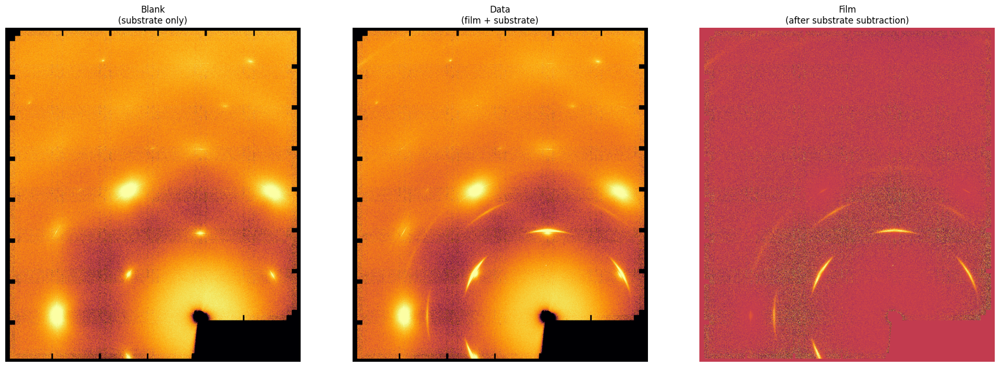

In [ ]:
fig, ax = plot_substrate_suppression(display_image_cr, display_image, film)

In [ ]:
import numpy as np


def compute_2d_spectrum(
    image,
    center,
    mask=True,
    n_radial=1000,
    n_azimuthal=360,
    r_min=0.0,
    r_max=None,
):
    """
    Re-grid a detector image into a polar (radius, azimuth) 'cake' spectrum
    around a known beam center.

    Output pixel [j, i] = mean intensity of all detector pixels falling in
    azimuthal bin j and radial bin i. Masked / NaN pixels are excluded from
    the average (not treated as zero), so detector gaps don't create
    artificial dark bands.

    Parameters
    ----------
    image       : 2D np.ndarray         - detector image
    center      : (x_center, y_center)  - beam center in pixel coords
    mask        : 2D bool array         - True = valid pixel. If None, finite pixels.
    n_radial    : int                   - number of radial bins (columns)
    n_azimuthal : int                   - number of azimuthal bins (rows, 0-360 deg)
    r_min, r_max: float                 - radial range in pixels (r_max=None -> auto max)

    Returns
    -------
    cake     : 2D np.ndarray (n_azimuthal, n_radial)  - I(azimuth, radius); NaN in empty bins
    r_edges  : 1D np.ndarray  - radial bin edges (pixels)
    az_edges : 1D np.ndarray  - azimuthal bin edges (degrees)
    """
    image = np.asarray(image, dtype=np.float64)
    xc, yc = center

    if mask is None:
        mask = np.isfinite(image)
    else:
        mask = mask & np.isfinite(image)

    # --- Per-pixel polar coordinates relative to the center ---
    h, w = image.shape
    yy, xx = np.indices((h, w))
    dx = xx - xc
    dy = yy - yc
    r = np.sqrt(dx**2 + dy**2)
    az = np.degrees(np.arctan2(dy, dx)) % 360.0     # azimuth 0-360 deg

    if r_max is None:
        r_max = r[mask].max()

    # --- Select valid pixels within the radial range ---
    sel = mask & (r >= r_min) & (r < r_max)
    r_sel = r[sel]
    az_sel = az[sel]
    I_sel = image[sel]

    # --- Bin: mean intensity per (azimuth, radius) cell = sum / count ---
    r_edges = np.linspace(r_min, r_max, n_radial + 1)
    az_edges = np.linspace(0.0, 360.0, n_azimuthal + 1)

    sum_I, _, _ = np.histogram2d(az_sel, r_sel, bins=[az_edges, r_edges], weights=I_sel)
    counts, _, _ = np.histogram2d(az_sel, r_sel, bins=[az_edges, r_edges])

    with np.errstate(invalid="ignore", divide="ignore"):
        cake = np.where(counts > 0, sum_I / counts, np.nan)

    return cake, r_edges, az_edges


def radial_profile(cake):
    """
    Collapse a cake to a 1D radial profile I(r) by averaging over azimuth,
    ignoring empty (NaN) bins. Returns a 1D array of length n_radial.
    """
    return np.nanmean(cake, axis=0)

import numpy as np
from scipy import ndimage


def mask_dead_regions(
    image,
    dead_value=0,
    threshold=None,
    detect_frame=True,
    fill_value=np.nan,
    return_mask=False,
):
    """
    Convert dead detector regions (stored as a flat value, usually 0) to NaN
    so the isfinite-based masking in suppress_substrate / compute_2d_spectrum
    treats them as missing rather than as real low-intensity pixels.

    Distinguishes two kinds of dead region for reporting:
      - 'frame'         : dead pixels connected to the image border
                          (the surround outside the active detector)
      - 'interior dead' : dead pixels inside the active area
                          (panel gaps, beamstop shadow, bad pixels)
    Both are set to `fill_value` (NaN by default).

    Parameters
    ----------
    image        : 2D np.ndarray   - input image (dead pixels == dead_value)
    dead_value   : float           - value used for dead pixels (default 0)
    threshold    : float | None    - if given, pixels <= threshold are dead
                                     (overrides the exact dead_value match)
    detect_frame : bool            - split out the connected border frame in `info`
    fill_value   : float           - value written into dead pixels (default NaN)
    return_mask  : bool            - also return the boolean valid mask

    Returns
    -------
    out  : 2D float np.ndarray   - image with dead regions set to fill_value
    mask : 2D bool np.ndarray    - (only if return_mask) True = valid pixel
    info : dict                  - counts: dead_total, frame, interior_dead, valid
    """
    img = np.asarray(image, dtype=np.float64)

    # --- Identify dead pixels ---
    if threshold is not None:
        dead = img <= threshold
    else:
        dead = (img == dead_value)
    dead |= ~np.isfinite(img)            # also fold in any pre-existing NaN/inf

    n_total_dead = int(dead.sum())

    # --- Separate the connected edge 'frame' from interior dead regions ---
    n_frame = 0
    if detect_frame and n_total_dead > 0:
        labels, _ = ndimage.label(dead)
        border_labels = (set(labels[0, :]) | set(labels[-1, :])
                         | set(labels[:, 0]) | set(labels[:, -1]))
        border_labels.discard(0)
        if border_labels:
            n_frame = int(np.isin(labels, list(border_labels)).sum())

    # --- Write fill value into all dead pixels ---
    out = img.copy()
    out[dead] = fill_value

    mask = np.isfinite(out)
    info = {
        "dead_total": n_total_dead,
        "frame": n_frame,
        "interior_dead": n_total_dead - n_frame,
        "valid": int(mask.sum()),
    }
    if return_mask:
        return out, mask, info
    return out, info

In [ ]:
cr, _ = mask_dead_regions(display_image_cr)

sp_blunk, r_edges, az_edges = compute_2d_spectrum(cr, [center_x, center_y],)
sp_blunk = radial_profile(sp_blunk)


/tmp/ipykernel_27500/791520400.py:80: RuntimeWarning: Mean of empty slice
  return np.nanmean(cake, axis=0)


In [ ]:
cr_f, _ = mask_dead_regions(display_image)

sp_bth, r_edges, az_edges = compute_2d_spectrum(cr_f, [center_x, center_y],)
sp_bth = radial_profile(sp_bth)

/tmp/ipykernel_27500/791520400.py:80: RuntimeWarning: Mean of empty slice
  return np.nanmean(cake, axis=0)


In [ ]:
sp_film, r_edges, az_edges = compute_2d_spectrum(film, [center_x, center_y],)
sp_film = radial_profile(sp_film)

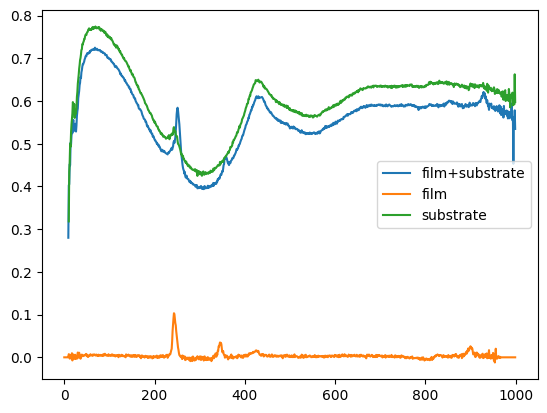

In [ ]:

plt.plot(sp_bth, label = 'film+substrate')
plt.plot(sp_film, label = 'film')
plt.plot(sp_blunk, label = 'substrate')

plt.legend()

In [ ]:
path_Ti_folder = r"/content/drive/MyDrive/Background Removal Data Nb blank Ti/Ti"

In [ ]:
import os
import glob
import numpy as np
import tifffile


def load_tiffs_from_folder(
    folder,
    pattern=("*.tif", "*.tiff"),
    N=5,
    recursive=False,
    as_float=True,
    verbose=True,
):
    """
    Find and load every TIFF in a folder.

    Parameters
    ----------
    folder    : str          - directory to search
    pattern   : tuple[str]   - filename globs to match (matched case-insensitively)
    recursive : bool         - also search sub-folders
    as_float  : bool         - cast images to float64 (recommended for processing)
    verbose   : bool         - print what was found / loaded

    Returns
    -------
    images : dict[str, np.ndarray]  - {filename: image_array}, sorted by filename
    """
    if not os.path.isdir(folder):
        raise NotADirectoryError(f"Not a folder: {folder}")

    # --- Collect matching paths (case-insensitive, de-duplicated) ---
    paths = set()
    for pat in pattern:
        for variant in (pat, pat.upper(), pat.lower()):
            search = (os.path.join(folder, "**", variant) if recursive
                      else os.path.join(folder, variant))
            paths.update(glob.glob(search, recursive=recursive))
    paths = sorted(paths)

    if verbose:
        print(f"Found {len(paths)} TIFF(s) in {folder}")

    # --- Load each one ---
    images = {}
    for p in paths[:N]:
        name = os.path.basename(p)
        try:
            arr = tifffile.imread(p)
            if as_float:
                arr = arr.astype(np.float64)
            images[name] = arr
            if verbose:
                print(f"  loaded {name:55s} shape={arr.shape} dtype={arr.dtype}")
        except Exception as e:
            if verbose:
                print(f"  FAILED {name}: {e}")
    return images

In [ ]:
ti_scan = load_tiffs_from_folder(path_Ti_folder)

Found 234 TIFF(s) in /content/drive/MyDrive/Background Removal Data Nb blank Ti/Ti
  loaded Ti_Nb_wafer_20260324-013244_a17201_sum.tiff             shape=(1733, 1529) dtype=float64
  loaded Ti_Nb_wafer_20260324-014337_72ef2f_sum.tiff             shape=(1733, 1529) dtype=float64
  loaded Ti_Nb_wafer_20260324-014427_58c0a2_sum.tiff             shape=(1733, 1529) dtype=float64
  loaded Ti_Nb_wafer_20260324-014517_1df080_sum.tiff             shape=(1733, 1529) dtype=float64
  loaded Ti_Nb_wafer_20260324-015745_e6b96d_sum.tiff             shape=(1733, 1529) dtype=float64


In [ ]:
for ti_key in ti_scan:
  film, alpha, info = suppress_substrate(
    ti_scan[ti_key],
    display_image_cr,
    bg_percentile=99.9)

  fig, ax = plot_substrate_suppression(display_image_cr, ti_scan[ti_key], film)
  plt.show()




In [ ]:
import numpy as np
from scipy.ndimage import gaussian_filter, binary_dilation, generate_binary_structure


def detect_substrate_spots(
    blank,
    mask=None,
    spot_percentile=99.0,
    blur_sigma=2.0,
    dilate_iters=8,
    verbose=True,
):
    """
    Build a mask of bright substrate-spot regions from the BLANK image.

    Detected on the blank (pure substrate) so film signal can't contaminate
    the detection. The result is meant to be passed to suppress_substrate as
    `fit_exclude`, so those pixels are left out of the alpha fit.

    Parameters
    ----------
    blank           : 2D np.ndarray   - substrate-only image
    mask            : 2D bool array   - True = valid. If None, finite pixels.
    spot_percentile : float           - intensity cutoff; pixels above it are spots
    blur_sigma      : float           - smoothing before thresholding (stabilizes detection)
    dilate_iters    : int             - grow the mask outward to cover spot wings
    verbose         : bool            - print spot-pixel count

    Returns
    -------
    spot_mask : 2D bool np.ndarray   - True = on/near a substrate spot
    """
    blank = np.asarray(blank, dtype=np.float64)
    if mask is None:
        mask = np.isfinite(blank)

    # Smooth (mask-aware) then threshold the brightest pixels
    sm = gaussian_filter(np.where(mask, blank, 0.0), sigma=blur_sigma)
    thr = np.percentile(sm[mask], spot_percentile)
    spots = mask & (sm >= thr)

    # Dilate to cover the spot wings, not just the peak
    if dilate_iters > 0:
        struct = generate_binary_structure(2, 2)   # 8-connectivity
        spots = binary_dilation(spots, structure=struct, iterations=dilate_iters)
    spots &= mask

    if verbose:
        print(f"[detect_substrate_spots] threshold p{spot_percentile} -> "
              f"{int(spots.sum())} spot pixels ({100*spots.mean():.2f}% of image)")
    return spots

In [ ]:
def suppress_substrate(
    data,
    blank,
    mask=None,
    bg_percentile=95,
    fit_exclude=None,        # bool mask of pixels to EXCLUDE from the alpha fit
    denoise_blank=None,
    clip_negative=False,
    verbose=True,
):
    """
    Suppress substrate: film = data - alpha * blank.

    alpha is fit robustly on background pixels. If `fit_exclude` is given
    (e.g. a substrate-spot mask from detect_substrate_spots), those pixels are
    left OUT of the alpha fit for a cleaner estimate — but the subtraction is
    still applied to the whole image, so substrate spots are still removed.

    Returns
    -------
    film  : 2D np.ndarray  - residual (NaN where masked)
    alpha : float
    info  : dict           - alpha, pct_negative, n_fit_pixels
    """
    data = np.asarray(data, dtype=np.float64)
    blank = np.asarray(blank, dtype=np.float64)
    if mask is None:
        mask = np.isfinite(data) & np.isfinite(blank)
    else:
        mask = mask & np.isfinite(data) & np.isfinite(blank)

    # Optional mask-aware denoise of the blank
    blank_use = blank
    if denoise_blank is not None:
        tmp = np.where(mask, blank, 0.0)
        sm = gaussian_filter(tmp, sigma=denoise_blank)
        norm = gaussian_filter(mask.astype(float), sigma=denoise_blank)
        with np.errstate(invalid="ignore", divide="ignore"):
            blank_use = np.where(norm > 0, sm / norm, blank)

    # Pixels used to FIT alpha: valid, minus excluded spot regions
    fit_mask = mask.copy()
    if fit_exclude is not None:
        fit_mask &= ~fit_exclude

    d = data[fit_mask]
    s = blank_use[fit_mask]
    bg = d < np.percentile(d, bg_percentile)
    ok = bg & (s > 0)
    alpha = float(np.median(d[ok] / s[ok]))

    # Subtract EVERYWHERE (not just the fit region)
    film = data - alpha * blank_use
    if clip_negative:
        film = np.where(film > 0, film, 0.0)
    film = np.where(mask, film, np.nan)

    r = film[mask]
    info = {
        "alpha": alpha,
        "pct_negative": float(np.mean(r < 0) * 100),
        "n_fit_pixels": int(ok.sum()),
    }
    if verbose:
        print(f"[suppress_substrate] alpha={alpha:.4f} | "
              f"%negative={info['pct_negative']:.1f} | "
              f"fit on {info['n_fit_pixels']} px")
    return film, alpha, info

[detect_substrate_spots] threshold p95.0 -> 181754 spot pixels (6.86% of image)
[suppress_substrate] alpha=63.4131 | %negative=46.2 | fit on 2108556 px


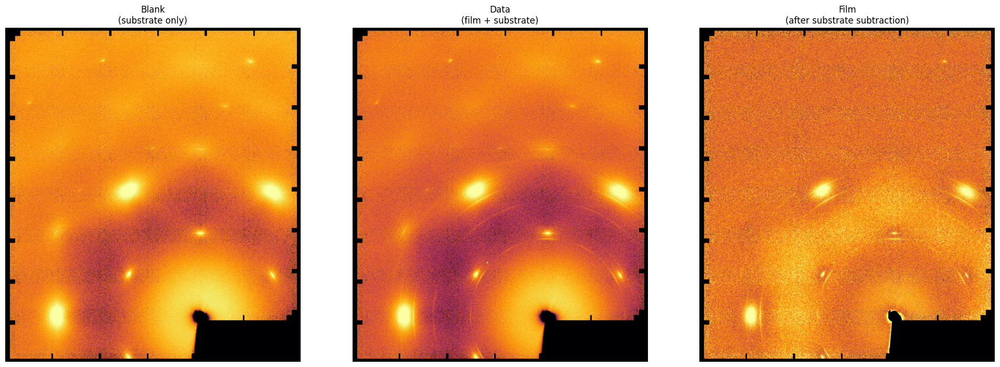

[detect_substrate_spots] threshold p95.0 -> 181754 spot pixels (6.86% of image)
[suppress_substrate] alpha=64.1305 | %negative=46.2 | fit on 2102621 px


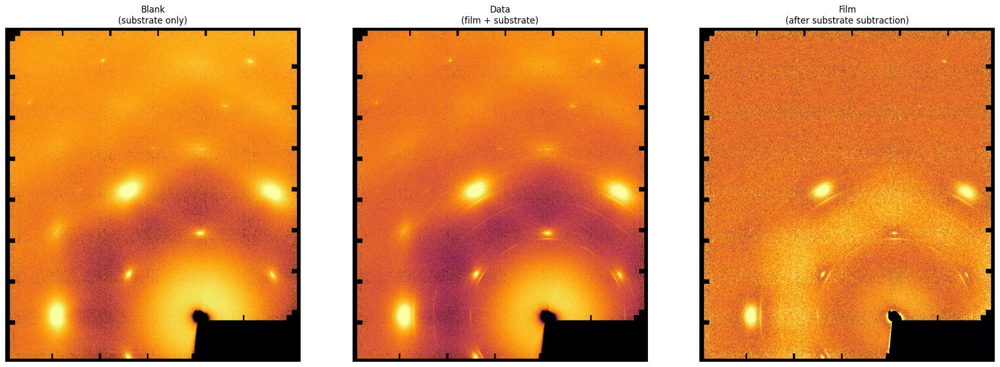

[detect_substrate_spots] threshold p95.0 -> 181754 spot pixels (6.86% of image)
[suppress_substrate] alpha=64.2448 | %negative=46.2 | fit on 2100835 px


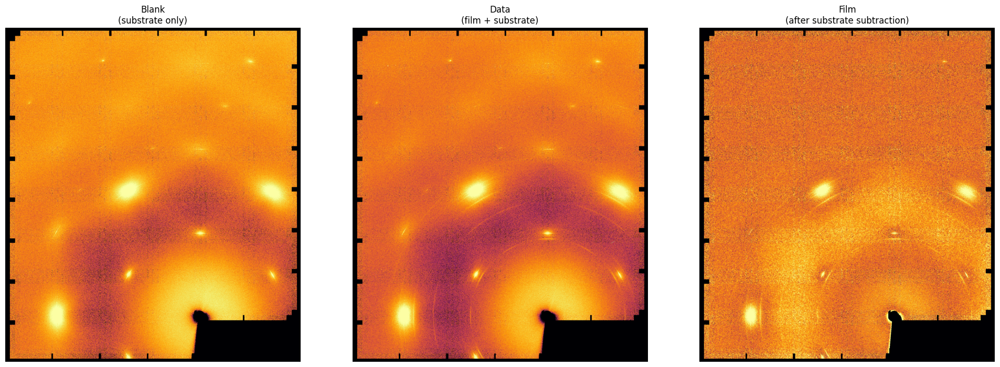

[detect_substrate_spots] threshold p95.0 -> 181754 spot pixels (6.86% of image)
[suppress_substrate] alpha=64.0569 | %negative=46.2 | fit on 2105629 px


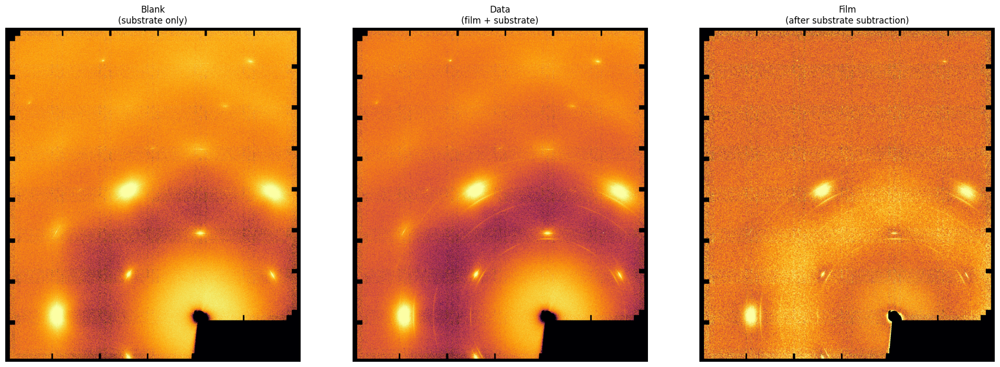

[detect_substrate_spots] threshold p95.0 -> 181754 spot pixels (6.86% of image)
[suppress_substrate] alpha=64.7071 | %negative=46.3 | fit on 2108355 px


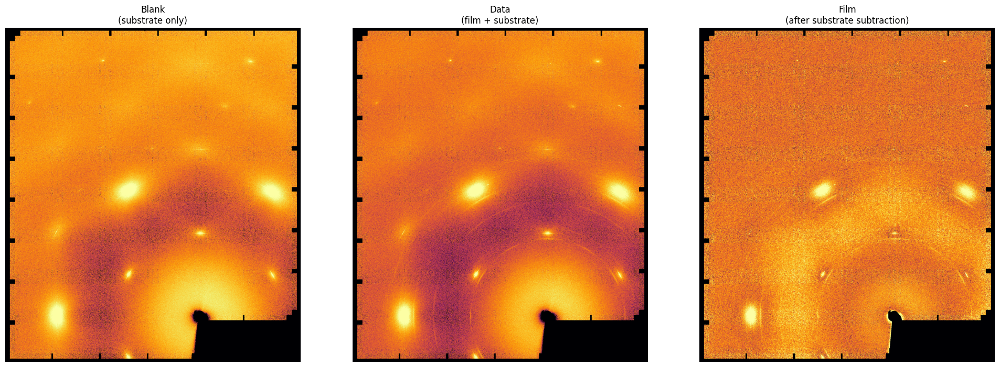

In [ ]:
for ti_key in ti_scan:

  spots = detect_substrate_spots(display_image_cr, spot_percentile=95.0, dilate_iters=8)

  film, alpha, info = suppress_substrate(ti_scan[ti_key], display_image_cr, denoise_blank=1.0, fit_exclude=spots)


  fig, ax = plot_substrate_suppression(display_image_cr, ti_scan[ti_key], film)
  plt.show()

In [ ]:
spots = detect_substrate_spots(blank, spot_percentile=99.0, dilate_iters=8)
film, alpha, info = suppress_substrate(data, blank, denoise_blank=1.0, fit_exclude=spots)

NameError: name 'blank' is not defined

In [ ]:
import numpy as np
from scipy.ndimage import gaussian_filter, binary_dilation, generate_binary_structure


def _masked_smooth(img, mask, sigma):
    """Mask-aware Gaussian smoothing: NaN/dead pixels don't bleed into the result."""
    z = np.where(mask, img, 0.0)
    num = gaussian_filter(z, sigma)
    den = gaussian_filter(mask.astype(float), sigma)
    with np.errstate(invalid="ignore", divide="ignore"):
        return np.where(den > 0, num / den, 0.0)


def _smooth_background(img, mask, sigma=40, iters=8):
    """
    Robust smooth-background estimate (the diffuse lower envelope under peaks).

    Iterative clipped smoothing: repeatedly smooth, then keep the lower of
    (smoothed, data) so sharp peaks get pulled down to the diffuse level while
    the broad background is preserved. No curve fitting -> very stable.
    """
    bg = _masked_smooth(img, mask, sigma)
    valid = np.where(mask, img, np.inf)
    for _ in range(iters):
        bg = _masked_smooth(bg, mask, sigma)
        bg = np.minimum(bg, valid)        # never exceed the data -> lower envelope
    return np.where(mask, bg, np.nan)


def suppress_substrate_2d(
    data,
    blank,
    mask=None,
    bg_sigma=40,
    bg_iters=8,
    spot_percentile=99.0,
    dilate_iters=6,
    protect_film=True,
    clip_negative=False,
    return_components=False,
    verbose=True,
):
    """
    Stable 2D substrate suppression by component modeling, with film protection.

    Models the substrate as  smooth_background + sharp_peaks  (both measured
    from the blank and scaled by a global exposure factor alpha), then removes
    it from the data. At substrate-peak locations the peak residual is clipped
    at >= 0, so a film reflection overlapping a substrate spot is preserved
    instead of being eaten by over-subtraction.

    Pipeline
    --------
      Bd, Bb = smooth backgrounds of data, blank   (iterative clipped smoothing)
      Pd, Pb = sharp components (image - smooth bg) - the peaks / arcs
      alpha  = robust exposure ratio  median(Bd / Bb)
      film   = (Bd - alpha*Bb)                      # diffuse part, ~0
             + peak_residual                        # Pd - alpha*Pb
               with peak_residual clipped >=0 inside substrate-spot regions

    Parameters
    ----------
    data, blank      : 2D np.ndarray   - data (film+substrate) and blank (substrate)
    mask             : 2D bool array   - True = valid. If None, finite pixels in both.
    bg_sigma         : float           - smoothing scale for the diffuse background (px).
                                         Make it a few x larger than the peak width.
    bg_iters         : int             - iterations of clipped smoothing (more = tighter envelope)
    spot_percentile  : float           - sharp-component cutoff defining substrate spots
    dilate_iters     : int             - grow the spot mask to cover peak wings
    protect_film     : bool            - clip peak residual >=0 at spots (preserve overlapping film)
    clip_negative    : bool            - clip the whole result at 0 (film-only display)
    return_components: bool            - also return the intermediate maps
    verbose          : bool            - print alpha + diagnostics

    Returns
    -------
    film  : 2D np.ndarray   - substrate-suppressed image (NaN where masked)
    alpha : float
    info  : dict
    comps : dict            - (only if return_components) Bd, Bb, Pd, Pb, spot_mask
    """
    data = np.asarray(data, dtype=np.float64)
    blank = np.asarray(blank, dtype=np.float64)
    if mask is None:
        mask = np.isfinite(data) & np.isfinite(blank)
    else:
        mask = mask & np.isfinite(data) & np.isfinite(blank)

    # 1. Smooth diffuse backgrounds
    Bd = _smooth_background(data, mask, sigma=bg_sigma, iters=bg_iters)
    Bb = _smooth_background(blank, mask, sigma=bg_sigma, iters=bg_iters)

    # 2. Sharp components (peaks / arcs above the diffuse background)
    Pd = np.where(mask, data - Bd, 0.0)
    Pb = np.where(mask, blank - Bb, 0.0)

    # 3. Global exposure factor from the smooth backgrounds (robust, smooth -> stable)
    ok = mask & (Bb > 0)
    alpha = float(np.median(Bd[ok] / Bb[ok]))

    # 4. Substrate-spot mask from the blank's sharp component
    pos = np.where(mask, np.clip(Pb, 0, None), 0.0)
    thr = np.percentile(pos[mask], spot_percentile)
    spot_mask = mask & (pos >= thr)
    if dilate_iters > 0:
        spot_mask = binary_dilation(
            spot_mask, structure=generate_binary_structure(2, 2), iterations=dilate_iters
        ) & mask

    # 5. Subtract: diffuse fully, peaks with film protection at spots
    diffuse_residual = Bd - alpha * Bb           # ~0 by construction of alpha
    peak_residual = Pd - alpha * Pb              # film survives where substrate cancels
    if protect_film:
        peak_residual = np.where(spot_mask, np.clip(peak_residual, 0, None), peak_residual)

    film = diffuse_residual + peak_residual
    if clip_negative:
        film = np.clip(film, 0, None)
    film = np.where(mask, film, np.nan)

    r = film[mask]
    info = {
        "alpha": alpha,
        "pct_negative": float(np.mean(r < 0) * 100),
        "spot_pixels": int(spot_mask.sum()),
        "spot_frac_pct": float(100 * spot_mask.mean()),
    }
    if verbose:
        print(f"[suppress_substrate_2d] alpha={alpha:.4f} | "
              f"%negative={info['pct_negative']:.1f} | "
              f"spots={info['spot_pixels']} ({info['spot_frac_pct']:.2f}%)")

    if return_components:
        comps = {"Bd": Bd, "Bb": Bb, "Pd": Pd, "Pb": Pb, "spot_mask": spot_mask}
        return film, alpha, info, comps
    return film, alpha, info

In [ ]:
for ti_key in ti_scan:

  spots = detect_substrate_spots(display_image_cr, spot_percentile=95.0, dilate_iters=8)

  #film, alpha, info = suppress_substrate(ti_scan[ti_key], display_image_cr, denoise_blank=1.0, fit_exclude=spots)
  film, alpha, info, comps = suppress_substrate_2d(ti_scan[ti_key], display_image_cr, return_components=True)


  fig, ax = plot_substrate_suppression(display_image_cr, ti_scan[ti_key], film)
  plt.show()

## 6. Predicted Single-Crystal Spots (from a CIF)

Computes the geometric reflections expected for a single-crystal wafer at a
given **zone axis** (the crystal facing relative to the beam).

> **Note:** This keeps reflections that may be destroyed by destructive
> interference, so it predicts **more** spots than will actually appear. The
> visible list is curated against the observed data in Section 7.

The block is organized as: user inputs -> read CIF -> build lattices ->
loop over `hkl` (apply absences + zone-axis rule + structure factor) ->
project to detector -> group into radial shells -> plot.


In [ ]:
# --------------------------- USER INPUTS ---------------------------
zone_axis     = np.array([0, 0, 1])  # hkl of the crystal zone axis
wavelength    = 0.1665               # incident beam wavelength (angstrom)
camera_length = 1054.0               # sample-to-detector distance (mm)
hkl_max       = 5                    # max |h|,|k|,|l| to search
r_cutoff      = 300                  # only report shells with r < this (mm)
r_bin         = 0.05                 # merge reflections closer than this (mm)


# --------------------------- HELPERS ---------------------------
def clean_float(x):
    """Strip ICSD uncertainty notation, e.g. '5.43053(7)' -> 5.43053."""
    if x is None:
        return None
    x = re.sub(r"\(.*\)", "", str(x).strip())
    return float(x)


def atomic_number(el):
    """Atomic number used as a crude scattering factor (fallback: carbon)."""
    try:
        return gemmi.Element(el).atomic_number
    except Exception:
        return 6


# --------------------------- READ CIF ---------------------------
doc = gemmi.cif.read_file(cif_file)
block = doc.sole_block()

# Space group (try several common CIF keys, default to P 1)
sg_symbol = (
    block.find_value("_symmetry_space_group_name_H-M")
    or block.find_value("_space_group_name_H-M_alt")
    or block.find_value("_symmetry_space_group_name_Hall")
    or "P 1"
)
try:
    spacegroup = gemmi.SpaceGroup(sg_symbol)
except Exception:
    spacegroup = gemmi.SpaceGroup("P 1")

# Lattice parameters
a = clean_float(block.find_value("_cell_length_a"))
b = clean_float(block.find_value("_cell_length_b"))
c = clean_float(block.find_value("_cell_length_c"))
alpha = np.deg2rad(clean_float(block.find_value("_cell_angle_alpha")))
beta  = np.deg2rad(clean_float(block.find_value("_cell_angle_beta")))
gamma = np.deg2rad(clean_float(block.find_value("_cell_angle_gamma")))


# --------------------------- REAL & RECIPROCAL LATTICE ---------------------------
va = np.array([a, 0.0, 0.0])
vb = np.array([b * np.cos(gamma), b * np.sin(gamma), 0.0])
vc_x = c * np.cos(beta)
vc_y = c * (np.cos(alpha) - np.cos(beta) * np.cos(gamma)) / np.sin(gamma)
vc_z = np.sqrt(max(0.0, c**2 - vc_x**2 - vc_y**2))
vc = np.array([vc_x, vc_y, vc_z])

V = np.dot(va, np.cross(vb, vc))                 # unit cell volume
recip = np.array([                                # reciprocal basis (b1, b2, b3)
    2 * np.pi * np.cross(vb, vc) / V,
    2 * np.pi * np.cross(vc, va) / V,
    2 * np.pi * np.cross(va, vb) / V,
])


# --------------------------- ATOMS ---------------------------
x_list = block.find_values("_atom_site_fract_x")
y_list = block.find_values("_atom_site_fract_y")
z_list = block.find_values("_atom_site_fract_z")
el_list = (block.find_values("_atom_site_type_symbol")
           or block.find_values("_atom_site_label"))

if len(x_list) == 0:
    raise RuntimeError("No atomic positions found in CIF")

atoms = []
for x, y, z, el in zip(x_list, y_list, z_list, el_list):
    el = re.sub(r"[^A-Za-z]", "", str(el))        # clean element label
    atoms.append((clean_float(x), clean_float(y), clean_float(z), el))


# --------------------------- DETECTOR BASIS ---------------------------
# Build an in-plane (x_axis, y_axis) frame perpendicular to the zone axis.
z_axis = zone_axis / np.linalg.norm(zone_axis)
tmp = np.array([1.0, 0.0, 0.0])
if abs(np.dot(tmp, z_axis)) > 0.9:
    tmp = np.array([0.0, 1.0, 0.0])
x_axis = np.cross(tmp, z_axis); x_axis /= np.linalg.norm(x_axis)
y_axis = np.cross(z_axis, x_axis)

u, v, w = np.round(10 * zone_axis).astype(int)    # integer zone axis


# --------------------------- HKL LOOP ---------------------------
spots = []
for h, k, l in product(range(-hkl_max, hkl_max + 1),
                       range(-hkl_max, hkl_max + 1),
                       range(-hkl_max, hkl_max + 1)):
    if (h, k, l) == (0, 0, 0):
        continue

    # Skip systematically absent reflections (symmetry)
    try:
        if spacegroup.is_sys_absent(h, k, l):
            continue
    except Exception:
        pass

    # Zone-axis condition: reflection must lie in the plane (h*u + k*v + l*w = 0)
    if (h * u + k * v + l * w) != 0:
        continue

    # Reciprocal-lattice vector for this reflection
    G = h * recip[0] + k * recip[1] + l * recip[2]

    # Structure factor (atomic number as scattering factor)
    F = sum(atomic_number(el) * np.exp(2j * np.pi * (h * x + k * y + l * z))
            for x, y, z, el in atoms)
    intensity = np.abs(F)**2
    if intensity < 1e-6:                           # true extinction
        continue

    # Project G onto the detector plane and convert to a radius (mm)
    R_x = camera_length * wavelength * np.dot(G, x_axis) / (2 * np.pi)
    R_y = camera_length * wavelength * np.dot(G, y_axis) / (2 * np.pi)
    r = np.sqrt(R_x**2 + R_y**2)

    spots.append((R_x, R_y, r, intensity, h, k, l))

if len(spots) == 0:
    raise RuntimeError("No diffraction spots generated")


# --------------------------- NORMALIZE & GROUP ---------------------------
spots = np.array(spots, dtype=object)
xs = np.array([s[0] for s in spots], dtype=float)
ys = np.array([s[1] for s in spots], dtype=float)
rs = np.array([s[2] for s in spots], dtype=float)
Is = np.array([s[3] for s in spots], dtype=float)
hkl = [(s[4], s[5], s[6]) for s in spots]

if np.max(Is) > 0:
    Is = Is / np.max(Is)                           # normalize intensities to 0-1

# Group reflections into radial shells (rounded to r_bin)
groups = defaultdict(list)
for i in range(len(rs)):
    groups[round(rs[i] / r_bin) * r_bin].append(hkl[i])


# --------------------------- REPORT SHELLS ---------------------------
print("\nRadial shells:\n")
for r_key in sorted(groups.keys()):
    if r_key < r_cutoff:
        print(f"r ~ {r_key:.3f}")
        print("  hkl:", sorted(set(groups[r_key])))
        print()


# --------------------------- PLOT ---------------------------
plt.figure(figsize=(8, 8))
plt.scatter(xs, ys, s=80 * Is, c=Is, cmap="inferno", alpha=0.85)
for i in range(len(xs)):
    plt.text(xs[i], ys[i], f"{hkl[i]}", fontsize=6, color="white")
plt.xlabel("Detector X")
plt.ylabel("Detector Y")
plt.title(f"Single Crystal XRD\nZone Axis {zone_axis}")
plt.axis("equal")
plt.grid(True)
plt.show()


## 7. Overlay Predicted Rings on the Image

Take the curated ring distances (in mm), convert to pixels, and draw them on
the loaded image around the detected center. This helps decide whether a spot
is a substrate reflection or a real, highly textured film data point.


In [ ]:
# Curated zone-axis ring distances in mm (sapphire wafer example).
# Commented-out values are allowed geometrically but not visible due to
# symmetry extinctions. The hkl groups producing each ring are noted inline.
r = [
#    42.350,
     73.350,   # hkl: [(-2,1,0),(-1,-1,0),(-1,2,0),(1,-2,0),(1,1,0),(2,-1,0)]
#    84.700,
#    112.050,
     127.050,  # hkl: [(-3,0,0),(-3,3,0),(0,-3,0),(0,3,0),(3,-3,0),(3,0,0)]
     146.700,  # hkl: [(-4,2,0),(-2,-2,0),(-2,4,0),(2,-4,0),(2,2,0),(4,-2,0)]
     152.700,  # hkl: [(-4,1,0),(-4,3,0),(-3,-1,0),...]
#    169.400,
     184.600,  # hkl: [(-5,2,0),(-5,3,0),(-3,-2,0),...]
#    194.050,
#    211.750,
#    220.050,
#    224.100,
#    235.800,
#    257.600,
#    264.450,
#    293.400,
#    296.450,
]


In [ ]:
# Convert ring distances from mm to pixels (detector pixel size = 0.172 mm/px)
PIXEL_SIZE_MM = 0.172
radii = [val / PIXEL_SIZE_MM for val in r]

overlay_diffraction_rings(
    display_image,
    center=(center_x, center_y),
    radii=radii,
)


## 8. Extra / Unused Utilities

Helper for computing a ring radius for a known `hkl` from Bragg geometry.
Not used in the main flow, but kept for reference.


In [ ]:
def Ring_Distance_Known(lattice_parameter, wavelength, pixel_size,
                        detector_distance, hkl):
    """
    Estimate the ring radius for a known reflection.

    Parameters
    ----------
    lattice_parameter : lattice parameter (angstrom)
    wavelength        : incident beam wavelength (angstrom)
    pixel_size        : physical pixel size (meters)
    detector_distance : sample-to-detector distance (meters)
    hkl               : [h, k, l]

    Returns
    -------
    R_meter, R_pixel  : ring radius in meters and in pixels
    """
    sum_hkl = sum(i**2 for i in hkl)
    d_hkl = math.sqrt(sum_hkl)
    R_meter = detector_distance * math.tan(
        2 * math.asin(wavelength * d_hkl / 2 / lattice_parameter)
    )
    R_pixel = R_meter / pixel_size
    return R_meter, R_pixel
